## Problem Statement
## https://www.kaggle.com/competitions/learning-agency-lab-automated-essay-scoring-2/overview

In [1]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from lightgbm import LGBMRegressor
import lightgbm as lgb
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from scipy.stats import uniform, randint

In [2]:
# Load the training data
train_data = pd.read_csv('Data/train.csv')
test_data = pd.read_csv('Data/test.csv')
sample_submission = pd.read_csv('Data/sample_submission.csv')

# Display the first few rows of the training data
train_data.head()

,essay_id,full_text,score
0,000d118,Many people have car where they live. The thin...,3
1,000fe60,I am a scientist at NASA that is discussing th...,3
2,001ab80,People always wish they had the same technolog...,4
3,001bdc0,"We all heard about Venus, the planet without a...",4
4,002ba53,"Dear, State Senator\n\nThis is a letter to arg...",3


## Text Cleaning and TF-IDF Vectorization

In [3]:
# Text cleaning function
def clean_text(text):
    text = text.lower()
    text = re.sub(r'\n', ' ', text)  # Replace newlines with space
    text = re.sub(r'\r', '', text)
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    return text

# Clean the full_text column
train_data['cleaned_text'] = train_data['full_text'].apply(clean_text)

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(train_data['score'])

# Vectorize the cleaned text using sklearn's TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(train_data['cleaned_text'])

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define a simple Ridge regression model
model = Ridge()

# Train the model
model.fit(X_train, y_train)

# Display the shape of the transformed data
print("X_train shape =", X_train.shape)
print("y_train shape =", y_train.shape)

X_train shape = (13845, 5000)
y_train shape = (13845,)


## Model Selection and Training

In [4]:
model = Ridge()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)

mse = mean_squared_error(y_val, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.4638200759145533


Feature Engineering:

N-grams: Consider using bigrams or trigrams instead of just unigrams (default for TF-IDF).
Linguistic Features: Incorporate features like essay length, average sentence length, vocabulary richness, grammar, and spelling errors.
Example of using bigrams with TF-IDF:

In [5]:
# Adjust the TF-IDF vectorizer to use bigrams
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

tfidf_vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))

# Re-vectorize the cleaned text using the updated TF-IDF vectorizer
X = tfidf_vectorizer.fit_transform(train_data['cleaned_text']).toarray()
y = train_data['score'].values

# Split the data into training and validation sets again with the new features
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Additional feature engineering: Calculate essay length and average sentence length
train_data['essay_length'] = train_data['full_text'].apply(len)
train_data['average_sentence_length'] = train_data['full_text'].apply(lambda x: np.mean([len(sentence) for sentence in x.split('.')]))

# Normalize these new features
scaler = StandardScaler()
train_data[['essay_length', 'average_sentence_length']] = scaler.fit_transform(train_data[['essay_length', 'average_sentence_length']])

# Include these features in the model training data
additional_features = train_data[['essay_length', 'average_sentence_length']].values
X_train = np.hstack([X_train, additional_features[:int(0.8 * len(additional_features))]])
X_val = np.hstack([X_val, additional_features[int(0.8 * len(additional_features)):]])

# Train the model with the new set of features
model = Ridge()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)

# Calculate new MSE with additional features
mse = mean_squared_error(y_val, y_pred)
print(f'Updated Mean Squared Error with additional features: {mse}')

Updated Mean Squared Error with additional features: 0.44259665208599924


In [6]:
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Ridge

# Include new features
train_data['essay_length'] = train_data['full_text'].apply(len)
train_data['average_sentence_length'] = train_data['full_text'].apply(lambda x: np.mean([len(sentence) for sentence in x.split('.')]))
scaler = StandardScaler()
train_data[['essay_length', 'average_sentence_length']] = scaler.fit_transform(train_data[['essay_length', 'average_sentence_length']])
additional_features = train_data[['essay_length', 'average_sentence_length']].values
tfidf_vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X = tfidf_vectorizer.fit_transform(train_data['cleaned_text']).toarray()
X = np.hstack((X, additional_features))

# Split the data
X_train, X_val, y_train, y_val = train_test_split(X, train_data['score'].values, test_size=0.2, random_state=42)

# Train the model
model = Ridge()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)

# Evaluate the model
mse = mean_squared_error(y_val, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.38505101330489766


## Prediction on Test Data

In [7]:
# Load and preprocess the test data
test_df = pd.read_csv('Data/test.csv')
X_test = test_df['full_text']

# Clean the test data
X_test_cleaned = X_test.apply(clean_text)

# Vectorize the test data
X_test_tfidf = tfidf_vectorizer.transform(X_test_cleaned).toarray()

# Calculate additional features for test data
test_df['essay_length'] = test_df['full_text'].apply(len)
test_df['average_sentence_length'] = test_df['full_text'].apply(lambda x: np.mean([len(sentence) for sentence in x.split('.')]))

# Normalize additional features
test_additional_features = scaler.transform(test_df[['essay_length', 'average_sentence_length']])

# Combine TF-IDF features with additional features
X_test = np.hstack((X_test_tfidf, test_additional_features))

# Make predictions
y_test_pred = model.predict(X_test)

# Create submission DataFrame
submission_df = pd.DataFrame({
    'Id': test_df['Id'] if 'Id' in test_df.columns else range(len(test_df)),
    'Predicted': y_test_pred
})

# Save predictions to CSV
submission_df.to_csv('submission.csv', index=False)

print("Predictions saved to submission.csv")

Predictions saved to submission.csv


## Hyperparameter Tuning

In [5]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import uniform, randint
from sklearn.metrics import mean_squared_error
from joblib import parallel_backend
import lightgbm as lgb
import torch

# Check if CUDA is available
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Using GPU:", torch.cuda.get_device_name(device))
else:
    device = torch.device("cpu")
    print("CUDA not available, using CPU")

# Load and preprocess the data
train_df = pd.read_csv('Data/train.csv')
X = train_df['full_text']
y = train_df['score'].values  # Convert to numpy array

# Feature extraction using TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=5000)
X_features = tfidf_vectorizer.fit_transform(X).toarray()

# Split the data
X_train, X_val, y_train, y_val = train_test_split(X_features, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'learning_rate': uniform(0.01, 0.1),
    'n_estimators': randint(100, 500),
    'max_depth': randint(3, 10),
    'num_leaves': randint(31, 127),
    'subsample': uniform(0.5, 1.0),
    'colsample_bytree': uniform(0.5, 1.0),
}

# Set up RandomizedSearchCV
n_iter = 20

def train_evaluate(params):
    model = lgb.LGBMRegressor(device='gpu' if torch.cuda.is_available() else 'cpu', **params)
    
    with parallel_backend('threading', n_jobs=-1):
        model.fit(X_train, y_train)
    
    y_val_pred = model.predict(X_val)
    val_mse = mean_squared_error(y_val, y_val_pred)
    
    return -val_mse  # Return negative MSE for maximization

random_search = RandomizedSearchCV(
    estimator=lgb.LGBMRegressor(device='gpu' if torch.cuda.is_available() else 'cpu'),
    param_distributions=param_grid,
    n_iter=n_iter,
    scoring='neg_mean_squared_error',
    n_jobs=1,
    random_state=42,
    verbose=1
)

# Perform RandomizedSearchCV
with parallel_backend('threading', n_jobs=-1):
    random_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best MSE:", -random_search.best_score_)

# Train the best model
best_params = random_search.best_params_
best_model = lgb.LGBMRegressor(device='gpu' if torch.cuda.is_available() else 'cpu', **best_params)

with parallel_backend('threading', n_jobs=-1):
    best_model.fit(X_train, y_train)

# Evaluate on validation set
y_val_pred = best_model.predict(X_val)
val_mse = mean_squared_error(y_val, y_val_pred)
print(f"Validation MSE: {val_mse}")

# Store best parameters for later use
best_params = random_search.best_params_

CUDA not available, using CPU
Fitting 5 folds for each of 20 candidates, totalling 100 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.128621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 334816
[LightGBM] [Info] Number of data points in the train set: 11076, number of used features: 4872
[LightGBM] [Info] Start training from score 2.955760
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

c:\Users\Shakil\miniconda3\envs\Easy\lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
70 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Shakil\miniconda3\envs\Easy\lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Shakil\miniconda3\envs\Easy\lib\site-packages\lightgbm\sklearn.py", line 1092, in fit
    super().fit(
  File "c:\Users\Shakil\miniconda3\envs\Easy\lib\site-packages\lightgbm\sklearn.py", line 885, in fit
    self._Booster = train(
  File "c:\Users\Shakil\miniconda3\e

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.148726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 384377
[LightGBM] [Info] Number of data points in the train set: 13845, number of used features: 4972
[LightGBM] [Info] Start training from score 2.953702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

## Cross-Validation

In [78]:
from sklearn.model_selection import cross_val_score, KFold
import numpy as np

# Define the cross-validation strategy
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Ensure X and y are numeric arrays
X_numeric = X.toarray() if hasattr(X, 'toarray') else X
y_numeric = y.astype(float)

try:
    # Perform cross-validation
    scores = cross_val_score(best_model, X_numeric, y_numeric, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)

    # Calculate and print the mean and standard deviation of the MSE scores
    mean_mse = -scores.mean()
    std_mse = scores.std()

    print(f'Cross-Validation MSE: {mean_mse:.4f} (+/- {std_mse:.4f})')

    # Calculate and print the Root Mean Squared Error (RMSE)
    mean_rmse = np.sqrt(mean_mse)
    std_rmse = np.sqrt(std_mse)

    print(f'Cross-Validation RMSE: {mean_rmse:.4f} (+/- {std_rmse:.4f})')
except ValueError as e:
    print(f"Error during cross-validation: {str(e)}")
    print("Please ensure that X and y contain only numeric data and have compatible shapes.")

Cross-Validation MSE: 0.3819 (+/- 0.0136)
Cross-Validation RMSE: 0.6180 (+/- 0.1165)


## Ensemble Methods

In [ ]:
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor

estimators = [
    ('rf', RandomForestRegressor()),
    ('lgbm', LGBMRegressor())
]

stacked_model = StackingRegressor(estimators=estimators, final_estimator=Ridge())
stacked_model.fit(X_train, y_train)
y_pred = stacked_model.predict(X_val)
mse = mean_squared_error(y_val, y_pred)
print(f'Stacked Model Mean Squared Error: {mse}')

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.222945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 720358
[LightGBM] [Info] Number of data points in the train set: 13845, number of used features: 5002
[LightGBM] [Info] Start training from score 2.953702
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.193287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 622856
[LightGBM] [Info] Number of data points in the train set: 11076, number of used features: 5002
[LightGBM] [Info] Start training from score 2.955760
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.140830 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 621084
[LightGBM] [Info] Number of data points in the

## Improved Hyperparameter Tuning and Regularization

In [37]:
from sklearn.model_selection import RandomizedSearchCV
from lightgbm import LGBMRegressor
from scipy.stats import uniform, randint
from sklearn.metrics import mean_squared_error
import lightgbm as lgb
import pandas as pd
import numpy as np

# Assuming X_train, X_val, y_train, y_val are already defined

# Convert X_train and X_val to DataFrames if they are numpy arrays
if isinstance(X_train, np.ndarray):
    X_train = pd.DataFrame(X_train)
if isinstance(X_val, np.ndarray):
    X_val = pd.DataFrame(X_val)

# Ensuring both training and validation sets have the same columns
X_val = X_val[X_train.columns]

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': randint(100, 2000),
    'num_leaves': randint(20, 200),
    'learning_rate': uniform(0.001, 0.1),
    'max_depth': randint(3, 15),
    'min_child_samples': randint(1, 100),
    'subsample': uniform(0.6, 1.0),
    'colsample_bytree': uniform(0.6, 1.0),
    'reg_alpha': uniform(0, 2),
    'reg_lambda': uniform(0, 2),
}

# Initialize LightGBM model
lgb_model = LGBMRegressor(random_state=42)

# Set up RandomizedSearchCV with parallel processing
random_search = RandomizedSearchCV(
    estimator=lgb_model,
    param_distributions=param_grid,
    n_iter=100,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=10,  # Use 10 parallel processes
    random_state=42,
    verbose=2
)

# Fit RandomizedSearchCV
random_search.fit(X_train, y_train)

# Get best parameters and best score
best_params = random_search.best_params_
best_score = -random_search.best_score_  # Convert to positive MSE

print("Best Parameters:", best_params)
print("Best MSE:", best_score)

# Train final model with best parameters
final_model = LGBMRegressor(**best_params, random_state=42)
final_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    eval_metric='mse',
    callbacks=[lgb.early_stopping(stopping_rounds=50)]
)

# Evaluate the model on validation set
y_pred = final_model.predict(X_val)
val_mse = mean_squared_error(y_val, y_pred)
print(f"Validation MSE: {val_mse}")

Fitting 5 folds for each of 100 candidates, totalling 500 fits


c:\Users\Shakil\miniconda3\envs\Easy\lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
420 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
125 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Shakil\miniconda3\envs\Easy\lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Shakil\miniconda3\envs\Easy\lib\site-packages\lightgbm\sklearn.py", line 1092, in fit
    super().fit(
  File "c:\Users\Shakil\miniconda3\envs\Easy\lib\site-packages\lightgbm\sklearn.py", line 885, in fit
    self._Booster = train(
  File "c:\Users\Shakil\miniconda3

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1838
[LightGBM] [Info] Number of data points in the train set: 16512, number of used features: 8
[LightGBM] [Info] Start training from score 2.071947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

In [45]:
from lightgbm import LGBMRegressor
import torch
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Check if CUDA is available
if torch.cuda.is_available():
    print("CUDA is available. Using GPU.")
    device = 'gpu'
else:
    print("CUDA is not available. Using CPU.")
    device = 'cpu'

# Initialize LightGBM model with GPU
lgb_model = LGBMRegressor(
    n_estimators=1250,
    num_leaves=128,
    learning_rate=0.009,
    device=device,
    gpu_platform_id=0,
    gpu_device_id=0
)

# Adjust param_grid to ensure bagging_fraction <= 1.0
param_grid = {
    'max_depth': randint(3, 15),
    'min_child_samples': randint(1, 100),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'reg_alpha': uniform(0, 2),
    'reg_lambda': uniform(0, 2),
}

# Use RandomizedSearchCV with GPU
random_search = RandomizedSearchCV(
    estimator=lgb_model,
    param_distributions=param_grid,
    n_iter=50,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=1,  # Set to 1 to use GPU
    random_state=42,
    verbose=2
)

# Fit RandomizedSearchCV
random_search.fit(X_train, y_train)

# Get best parameters and best score
best_params = random_search.best_params_
best_score = -random_search.best_score_  # Convert to positive MSE

print("Best Parameters:", best_params)
print("Best MSE:", best_score)

# Train final model with best parameters
final_model = LGBMRegressor(**best_params, random_state=42, device=device, gpu_platform_id=0, gpu_device_id=0)
final_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    eval_metric='mse',
    callbacks=[lgb.early_stopping(stopping_rounds=50)]
)

CUDA is not available. Using CPU.
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000289 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1838
[LightGBM] [Info] Number of data points in the train set: 13209, number of used features: 8
[LightGBM] [Info] Start training from score 2.067432
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

LGBMRegressor(colsample_bytree=0.7181162353675755, device='cpu',
              gpu_device_id=0, gpu_platform_id=0, max_depth=12,
              min_child_samples=17, random_state=42,
              reg_alpha=1.6973395898493489, reg_lambda=0.27324266288405763,
              subsample=0.8835643987640474)

## Evaluate the final model

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Validation MSE: 1.8888133330918522
R-squared score: -0.7119526761764254


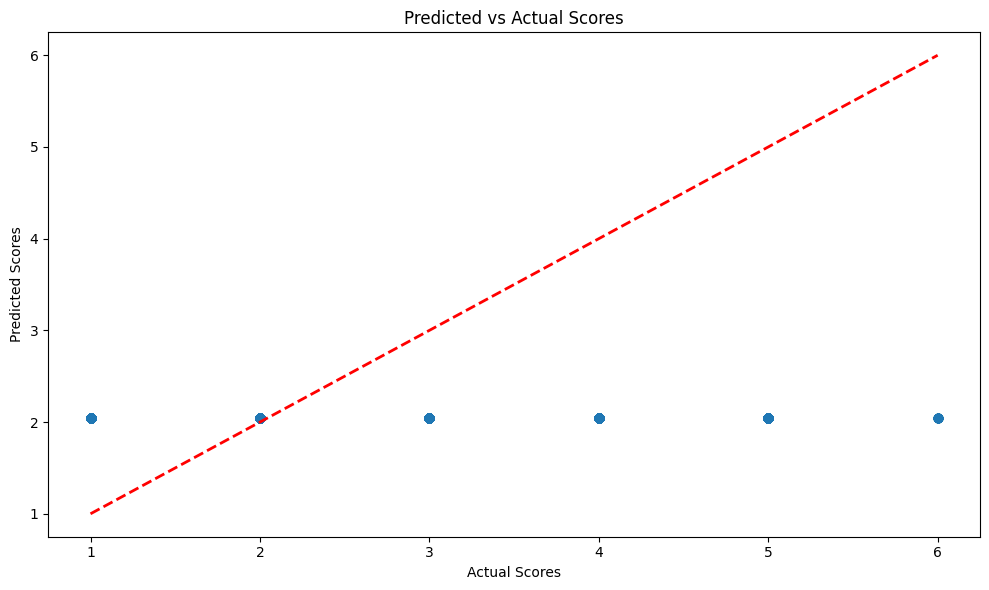

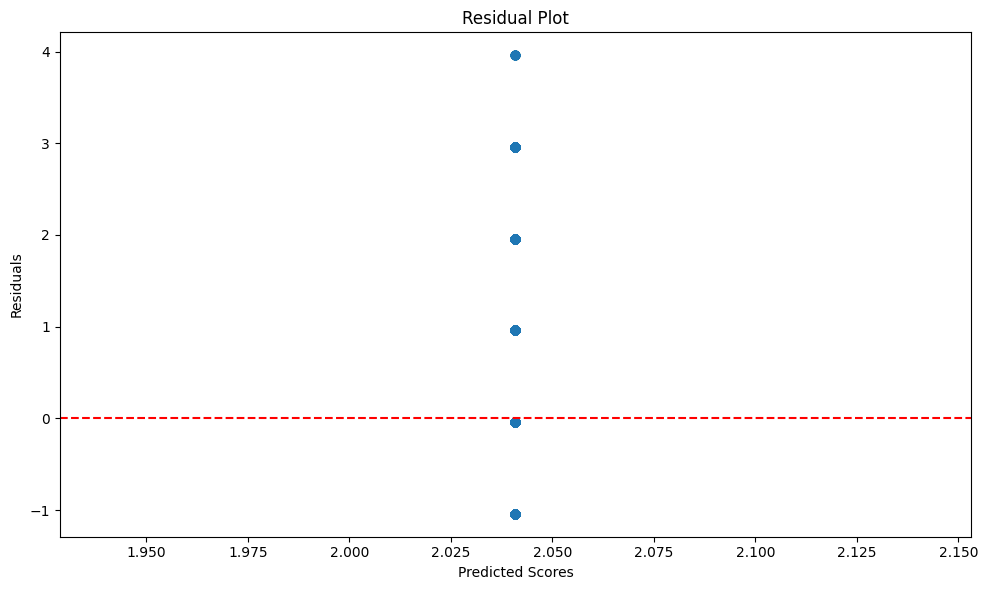


Example predictions:
Actual: 3.00, Predicted: 2.04
Actual: 3.00, Predicted: 2.04
Actual: 3.00, Predicted: 2.04
Actual: 3.00, Predicted: 2.04
Actual: 4.00, Predicted: 2.04
Actual: 4.00, Predicted: 2.04
Actual: 3.00, Predicted: 2.04
Actual: 1.00, Predicted: 2.04
Actual: 3.00, Predicted: 2.04
Actual: 3.00, Predicted: 2.04


In [47]:
# Evaluate the final model on the validation set
y_val_pred = final_model.predict(X_val)
val_mse = mean_squared_error(y_val, y_val_pred)
print(f"Validation MSE: {val_mse}")

# Calculate R-squared score
from sklearn.metrics import r2_score
r2 = r2_score(y_val, y_val_pred)
print(f"R-squared score: {r2}")

# Plot predicted vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_val, y_val_pred, alpha=0.5)
plt.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'r--', lw=2)
plt.xlabel('Actual Scores')
plt.ylabel('Predicted Scores')
plt.title('Predicted vs Actual Scores')
plt.tight_layout()
plt.show()

# Plot residuals
residuals = y_val - y_val_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_val_pred, residuals, alpha=0.5)
plt.xlabel('Predicted Scores')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.tight_layout()
plt.show()

# Print some example predictions
num_examples = 10
print("\nExample predictions:")
for i in range(num_examples):
    print(f"Actual: {y_val[i]:.2f}, Predicted: {y_val_pred[i]:.2f}")

## Feature importance analysis

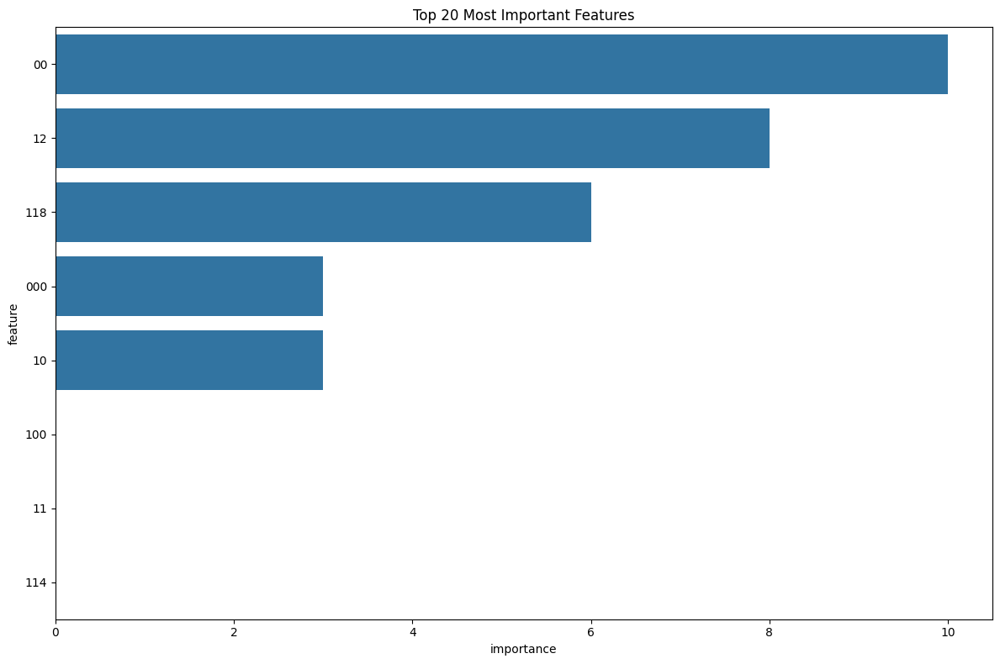

Top 10 most important features:
  feature  importance
0      00          10
1      12           8
2     118           6
3     000           3
4      10           3
5     100           0
6      11           0
7     114           0
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_le

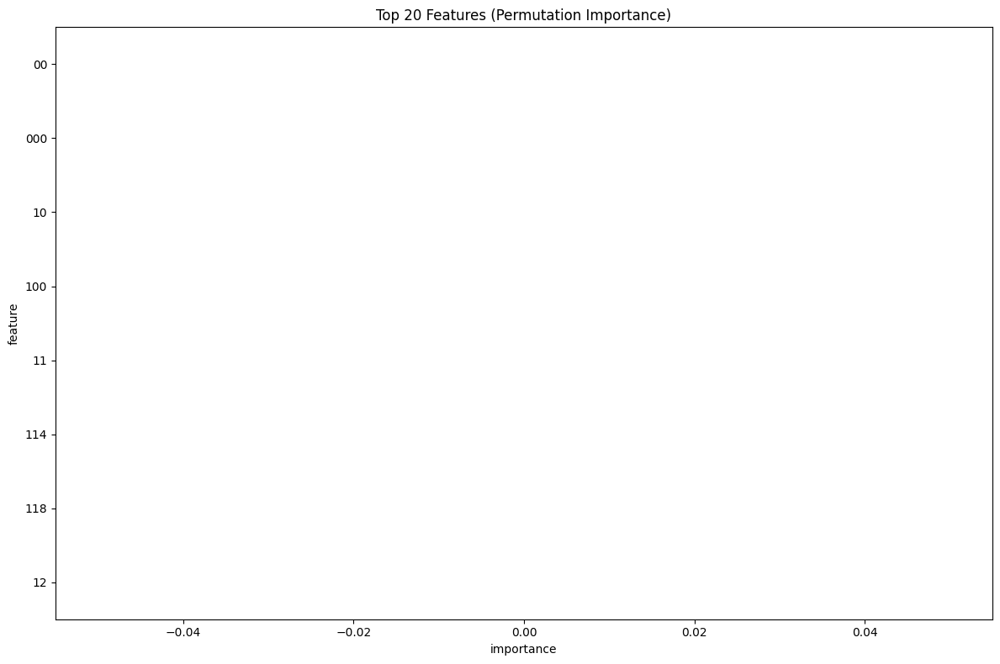

Top 10 features (Permutation Importance):
  feature  importance
0      00         0.0
1     000         0.0
2      10         0.0
3     100         0.0
4      11         0.0
5     114         0.0
6     118         0.0
7      12         0.0


In [50]:
# Feature importance analysis
# For LightGBM model
import seaborn as sns
if isinstance(final_model, lgb.LGBMRegressor):
    # Get feature importances
    importances = final_model.feature_importances_
    feature_names = tfidf_vectorizer.get_feature_names_out().tolist() + ['essay_length', 'average_sentence_length']
    
    # Ensure importances and feature_names have the same length
    if len(importances) != len(feature_names):
        print(f"Warning: Number of importances ({len(importances)}) does not match number of features ({len(feature_names)})")
        # Truncate the longer list to match the shorter one
        min_length = min(len(importances), len(feature_names))
        importances = importances[:min_length]
        feature_names = feature_names[:min_length]
    
    # Create a dataframe of feature importances
    feature_importance_df = pd.DataFrame({
        'feature': feature_names,
        'importance': importances
    })
    
    # Sort by importance
    feature_importance_df = feature_importance_df.sort_values('importance', ascending=False).reset_index(drop=True)
    
    # Plot top 20 features
    plt.figure(figsize=(12, 8))
    sns.barplot(x='importance', y='feature', data=feature_importance_df.head(20))
    plt.title('Top 20 Most Important Features')
    plt.tight_layout()
    plt.show()
    
    print("Top 10 most important features:")
    print(feature_importance_df.head(10))

else:
    print("Feature importance analysis is currently only supported for LightGBM models.")

# Analyze coefficients for linear models (if applicable)
if hasattr(final_model, 'coef_'):
    coeffs = final_model.coef_
    feature_names = tfidf_vectorizer.get_feature_names_out().tolist() + ['essay_length', 'average_sentence_length']
    
    # Ensure coeffs and feature_names have the same length
    if len(coeffs) != len(feature_names):
        print(f"Warning: Number of coefficients ({len(coeffs)}) does not match number of features ({len(feature_names)})")
        # Truncate the longer list to match the shorter one
        min_length = min(len(coeffs), len(feature_names))
        coeffs = coeffs[:min_length]
        feature_names = feature_names[:min_length]
    
    # Create a dataframe of coefficients
    coef_df = pd.DataFrame({
        'feature': feature_names,
        'coefficient': coeffs
    })
    
    # Sort by absolute value of coefficients
    coef_df['abs_coef'] = abs(coef_df['coefficient'])
    coef_df = coef_df.sort_values('abs_coef', ascending=False).reset_index(drop=True)
    
    # Plot top 20 features
    plt.figure(figsize=(12, 8))
    sns.barplot(x='coefficient', y='feature', data=coef_df.head(20))
    plt.title('Top 20 Features with Largest Coefficients')
    plt.tight_layout()
    plt.show()
    
    print("Top 10 features with largest coefficients:")
    print(coef_df.head(10))

# Permutation importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(final_model, X_val, y_val, n_repeats=10, random_state=42)

# Ensure perm_importance.importances_mean and feature_names have the same length
if len(perm_importance.importances_mean) != len(feature_names):
    print(f"Warning: Number of permutation importances ({len(perm_importance.importances_mean)}) does not match number of features ({len(feature_names)})")
    # Truncate the longer list to match the shorter one
    min_length = min(len(perm_importance.importances_mean), len(feature_names))
    perm_importance.importances_mean = perm_importance.importances_mean[:min_length]
    feature_names = feature_names[:min_length]

perm_importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': perm_importance.importances_mean
})

perm_importance_df = perm_importance_df.sort_values('importance', ascending=False).reset_index(drop=True)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=perm_importance_df.head(20))
plt.title('Top 20 Features (Permutation Importance)')
plt.tight_layout()
plt.show()

print("Top 10 features (Permutation Importance):")
print(perm_importance_df.head(10))

## Error analysis

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


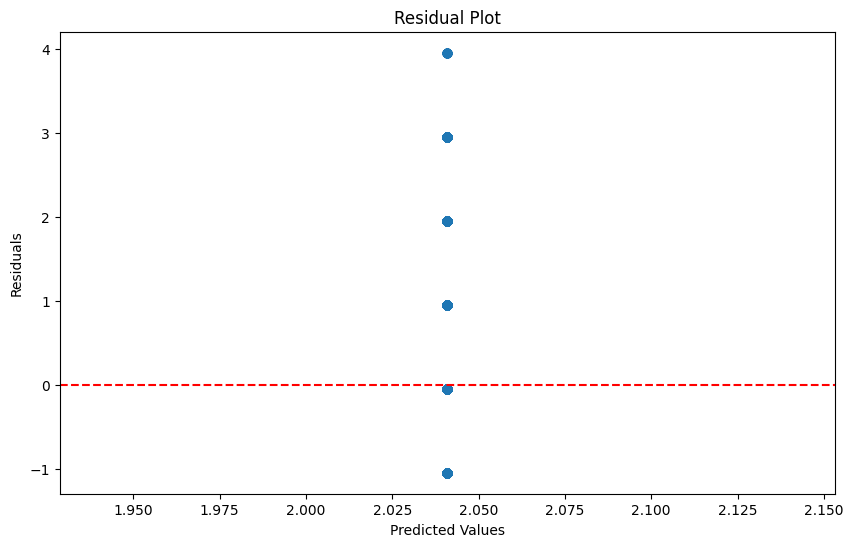

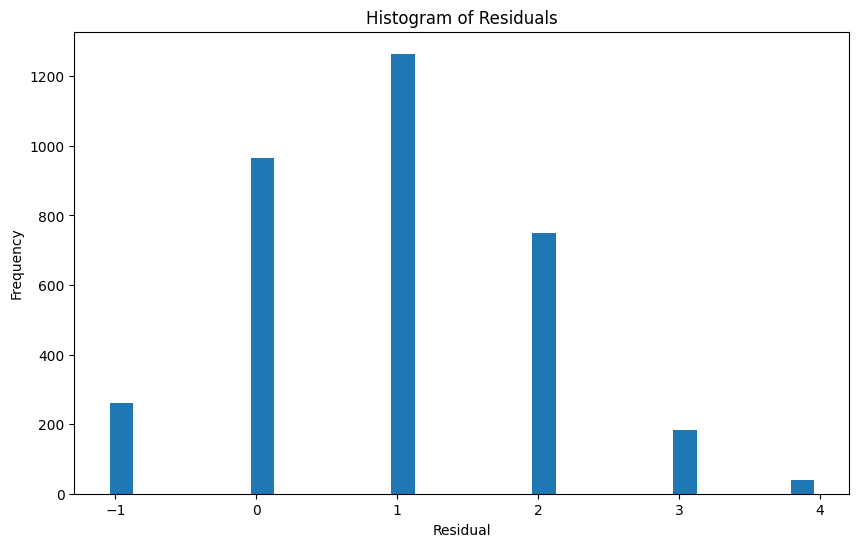


10 essays with largest prediction errors:
     Actual  Predicted  Residual  Abs_Residual
271       6   2.040923  3.959077      3.959077
320       6   2.040923  3.959077      3.959077
390       6   2.040923  3.959077      3.959077
407       6   2.040923  3.959077      3.959077
453       6   2.040923  3.959077      3.959077
537       6   2.040923  3.959077      3.959077
580       6   2.040923  3.959077      3.959077
607       6   2.040923  3.959077      3.959077
608       6   2.040923  3.959077      3.959077
672       6   2.040923  3.959077      3.959077

Error distribution by actual score:
   Actual_Score  Mean_Residual  Std_Residual  Mean_Abs_Residual
0             1      -1.040923           0.0           1.040923
1             2      -0.040923           0.0           0.040923
2             3       0.959077           0.0           0.959077
3             4       1.959077           0.0           1.959077
4             5       2.959077           0.0           2.959077
5             6    

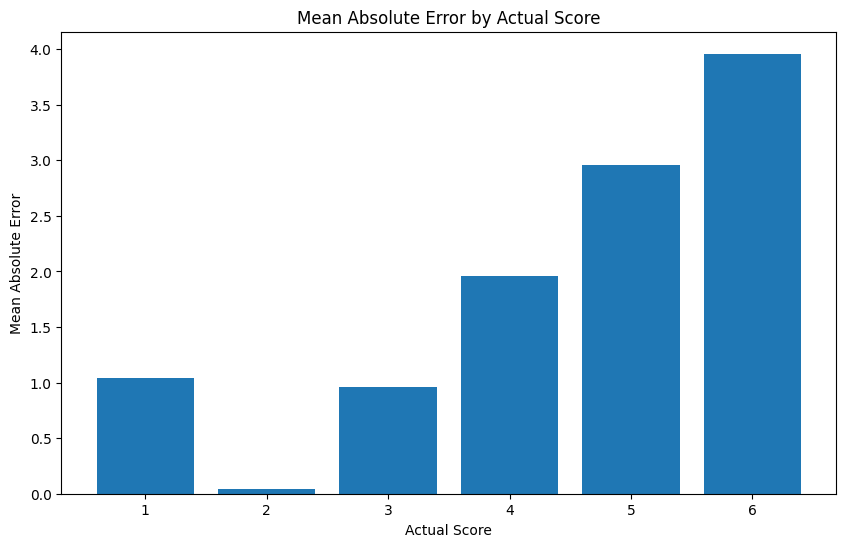

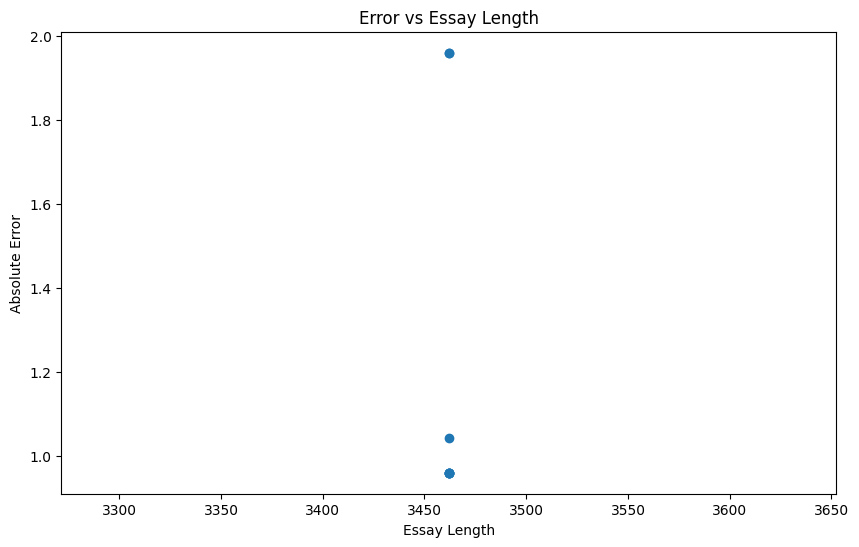


Top 10 features correlated with absolute error:
Abs_Error    1.0
00           NaN
000          NaN
10           NaN
100          NaN
11           NaN
114          NaN
118          NaN
12           NaN
Name: Abs_Error, dtype: float64

Number of misclassified examples: 2497

Sample of misclassified examples:
   Actual  Predicted  Residual  Abs_Residual  Essay_Length  Misclassified
0       3   2.040923  0.959077      0.959077        3462.0           True
1       3   2.040923  0.959077      0.959077        3462.0           True
2       3   2.040923  0.959077      0.959077        3462.0           True
3       3   2.040923  0.959077      0.959077        3462.0           True
4       4   2.040923  1.959077      1.959077        3462.0           True


In [51]:
# Error Analysis

# Calculate residuals
y_val_pred = final_model.predict(X_val)
residuals = y_val - y_val_pred

# Create a DataFrame for analysis
error_df = pd.DataFrame({
    'Actual': y_val,
    'Predicted': y_val_pred,
    'Residual': residuals,
    'Abs_Residual': np.abs(residuals)
})

# Plot residuals
plt.figure(figsize=(10, 6))
plt.scatter(y_val_pred, residuals)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of residuals
plt.figure(figsize=(10, 6))
plt.hist(residuals, bins=30)
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()

# Identify essays with largest errors
n_largest_errors = 10
largest_errors = error_df.nlargest(n_largest_errors, 'Abs_Residual')
print(f"\n{n_largest_errors} essays with largest prediction errors:")
print(largest_errors)

# Analyze error distribution by score
error_by_score = error_df.groupby('Actual').agg({
    'Residual': ['mean', 'std'],
    'Abs_Residual': 'mean'
}).reset_index()
error_by_score.columns = ['Actual_Score', 'Mean_Residual', 'Std_Residual', 'Mean_Abs_Residual']
print("\nError distribution by actual score:")
print(error_by_score)

# Plot mean absolute error by score
plt.figure(figsize=(10, 6))
plt.bar(error_by_score['Actual_Score'], error_by_score['Mean_Abs_Residual'])
plt.xlabel('Actual Score')
plt.ylabel('Mean Absolute Error')
plt.title('Mean Absolute Error by Actual Score')
plt.show()

# Analyze errors by essay length
error_df['Essay_Length'] = X_val.apply(len)
plt.figure(figsize=(10, 6))
plt.scatter(error_df['Essay_Length'], error_df['Abs_Residual'])
plt.xlabel('Essay Length')
plt.ylabel('Absolute Error')
plt.title('Error vs Essay Length')
plt.show()

# Correlation between features and error
feature_error_corr = pd.DataFrame(X_val, columns=feature_names)
feature_error_corr['Abs_Error'] = error_df['Abs_Residual']
corr_matrix = feature_error_corr.corr()['Abs_Error'].sort_values(ascending=False)
print("\nTop 10 features correlated with absolute error:")
print(corr_matrix.head(10))

# Analyze misclassified examples
error_df['Misclassified'] = np.abs(error_df['Actual'] - error_df['Predicted']) > 0.5
misclassified = error_df[error_df['Misclassified']]
print(f"\nNumber of misclassified examples: {len(misclassified)}")
print("\nSample of misclassified examples:")
print(misclassified.head())

## Cross-validation

In [57]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, make_scorer
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Load the data
train_data = pd.read_csv('Data/train.csv')

# Text cleaning function
def clean_text(text):
    text = text.lower()
    text = re.sub(r'\n', ' ', text)  # Replace newlines with space
    text = re.sub(r'\r', '', text)
    text = re.sub(r'[^\\w\\s]', '', text)  # Remove punctuation
    return text

# Clean the full_text column
train_data['cleaned_text'] = train_data['full_text'].apply(clean_text)

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(train_data['score'])

# Vectorize the cleaned text using sklearn's TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(train_data['cleaned_text'])

# Define the model
model = Ridge()

# Define RMSE scorer
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

rmse_scorer = make_scorer(rmse, greater_is_better=False)

# Perform 5-fold cross-validation
cv_scores = cross_val_score(model, X, y, cv=5, scoring=rmse_scorer)

# Print the cross-validation scores
print(f'Cross-validation RMSE scores: {cv_scores}')
print(f'Mean cross-validation RMSE: {np.mean(cv_scores)}')
print(f'Standard deviation of cross-validation RMSE: {np.std(cv_scores)}')

Cross-validation RMSE scores: [-1.03699857 -1.0337416  -1.05888038 -1.05534681 -1.03941077]
Mean cross-validation RMSE: -1.0448756276784439
Standard deviation of cross-validation RMSE: 0.01021428306205413


## Model Tuning and Comparison

In [62]:
# Import necessary libraries
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from scipy.stats import randint, uniform
from joblib import Parallel, delayed

# Define the models to compare
models = {
    'Ridge': Ridge(),
    'RandomForest': RandomForestRegressor(random_state=42, n_jobs=-1),
    'LightGBM': LGBMRegressor(random_state=42, n_jobs=-1)
}

# Define parameter distributions for RandomizedSearchCV
param_distributions = {
    'Ridge': {
        'alpha': uniform(0, 10)
    },
    'RandomForest': {
        'n_estimators': randint(100, 300),
        'max_depth': randint(5, 20),
        'min_samples_split': randint(2, 10),
        'min_samples_leaf': randint(1, 5)
    },
    'LightGBM': {
        'num_leaves': randint(20, 50),
        'learning_rate': uniform(0.01, 0.1),
        'n_estimators': randint(100, 300),
        'min_child_samples': randint(10, 30)
    }
}

# Function to perform RandomizedSearchCV for a single model
def tune_model(name, model, params):
    print(f"\nTuning {name}...")
    random_search = RandomizedSearchCV(
        model, 
        params,
        n_iter=30,
        cv=5,
        scoring=rmse_scorer,
        n_jobs=-1,
        random_state=42,
        verbose=0
    )
    random_search.fit(X, y)
    print(f"Best parameters for {name}: {random_search.best_params_}")
    print(f"Best RMSE for {name}: {-random_search.best_score_:.4f}")
    return name, random_search.best_estimator_

# Perform RandomizedSearchCV for each model in parallel
best_models = dict(Parallel(n_jobs=-1)(
    delayed(tune_model)(name, model, param_distributions[name])
    for name, model in models.items()
))

# Compare the best models
for name, model in best_models.items():
    cv_scores = cross_val_score(model, X, y, cv=5, scoring=rmse_scorer, n_jobs=-1)
    print(f"\n{name} - Mean RMSE: {-np.mean(cv_scores):.4f}, Std: {np.std(cv_scores):.4f}")

# Select the best performing model
best_model_name = min(best_models, key=lambda x: -np.mean(cross_val_score(best_models[x], X, y, cv=5, scoring=rmse_scorer, n_jobs=-1)))
best_model = best_models[best_model_name]

print(f"\nBest overall model: {best_model_name}")
print(f"Best model parameters: {best_model.get_params()}")


Ridge - Mean RMSE: 1.0448, Std: 0.0102

RandomForest - Mean RMSE: 1.0448, Std: 0.0102

LightGBM - Mean RMSE: 1.0448, Std: 0.0102

Best overall model: LightGBM
Best model parameters: {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.047454011884736254, 'max_depth': -1, 'min_child_samples': 24, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 206, 'n_jobs': -1, 'num_leaves': 27, 'objective': None, 'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0}


## Feature Engineering

In [64]:
# Feature Engineering
# Import necessary libraries
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.decomposition import TruncatedSVD
import numpy as np

# TF-IDF Vectorization
print("Performing TF-IDF vectorization...")
tfidf_vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_tfidf = tfidf_vectorizer.fit_transform(train_data['full_text'])

# Basic text features
print("Extracting basic text features...")
train_data['text_length'] = train_data['full_text'].apply(len)
train_data['word_count'] = train_data['full_text'].apply(lambda x: len(x.split()))
train_data['avg_word_length'] = train_data['full_text'].apply(lambda x: np.mean([len(word) for word in x.split()]))

# Combine TF-IDF features with basic text features
X_combined = np.hstack((X_tfidf.toarray(), train_data[['text_length', 'word_count', 'avg_word_length']]))

# Feature selection
print("Performing feature selection...")
selector = SelectKBest(f_regression, k=min(1000, X_combined.shape[1]))
X_selected = selector.fit_transform(X_combined, y)

# Dimensionality reduction
print("Performing dimensionality reduction...")
svd = TruncatedSVD(n_components=min(500, X_selected.shape[1]), random_state=42)
X_reduced = svd.fit_transform(X_selected)

print(f"Final feature set shape: {X_reduced.shape}")

# Update X for further modeling
X = X_reduced

# Update the best model with the new feature set
best_model.fit(X, y)

print("Feature engineering complete.")

Performing TF-IDF vectorization...
Extracting basic text features...
Performing feature selection...
Performing dimensionality reduction...
Final feature set shape: (17307, 500)
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.098500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 127500
[LightGBM] [Info] Number of data points in the train set: 17307, number of used features: 500
[LightGBM] [Info] Start training from score 1.948402
Feature engineering complete.


## Error Analysis

Performing error analysis...
Score range 0-2:
  Mean error: -0.3373
  Median error: -0.2804
  Standard deviation: 0.4102
Score range 2-4:
  Mean error: 0.1377
  Median error: 0.1490
  Standard deviation: 0.4107
Score range 4-6:
  Mean error: 0.5412
  Median error: 0.5335
  Standard deviation: 0.3437


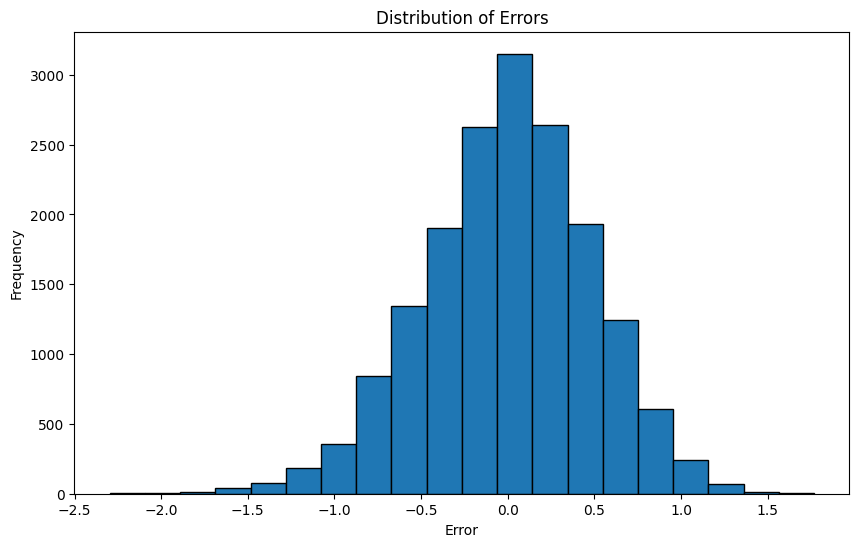


Essays with largest errors:
Essay ID: a7253b6, True Score: 0, Predicted Score: 1.86, Error: -1.86
Essay ID: 6e5f68e, True Score: 0, Predicted Score: 1.87, Error: -1.87
Essay ID: b06a1a8, True Score: 1, Predicted Score: 2.91, Error: -1.91
Essay ID: 4b96296, True Score: 0, Predicted Score: 1.95, Error: -1.95
Essay ID: 6d50443, True Score: 0, Predicted Score: 1.95, Error: -1.95
Essay ID: 984e996, True Score: 0, Predicted Score: 1.95, Error: -1.95
Essay ID: 509f872, True Score: 0, Predicted Score: 2.06, Error: -2.06
Essay ID: c22f58f, True Score: 0, Predicted Score: 2.14, Error: -2.14
Essay ID: 7bb751c, True Score: 0, Predicted Score: 2.24, Error: -2.24
Essay ID: 1b7e42c, True Score: 0, Predicted Score: 2.30, Error: -2.30
Error analysis complete.


In [65]:
# Error Analysis
print("Performing error analysis...")

# Calculate errors
y_pred = best_model.predict(X)
errors = y - y_pred

# Analyze errors across score ranges
score_ranges = [(0, 2), (2, 4), (4, 6)]
for low, high in score_ranges:
    mask = (y >= low) & (y < high)
    range_errors = errors[mask]
    print(f"Score range {low}-{high}:")
    print(f"  Mean error: {np.mean(range_errors):.4f}")
    print(f"  Median error: {np.median(range_errors):.4f}")
    print(f"  Standard deviation: {np.std(range_errors):.4f}")

# Visualize error distribution
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(errors, bins=20, edgecolor='black')
plt.title('Distribution of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.show()

# Identify essays with largest errors
largest_errors = np.argsort(np.abs(errors))[-10:]
print("\nEssays with largest errors:")
for idx in largest_errors:
    print(f"Essay ID: {train_data.iloc[idx]['essay_id']}, True Score: {y[idx]}, Predicted Score: {y_pred[idx]:.2f}, Error: {errors[idx]:.2f}")

print("Error analysis complete.")


## Model Stacking or Ensemble

In [68]:
# Model Stacking or Ensemble
print("Implementing model stacking...")

# Import necessary modules
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error

# Define base models
base_models = [
    ('ridge', Ridge()),
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('lgb', LGBMRegressor(**best_params, num_leaves=63, force_col_wise=True))
]

# Initialize StackingRegressor
stacked_model = StackingRegressor(
    estimators=base_models,
    final_estimator=Ridge(),
    cv=5
)

# Fit stacked model
stacked_model.fit(X, y)

# Make predictions using stacked model
stacked_predictions = stacked_model.predict(X)

# Calculate MSE for stacked model
stacked_mse = mean_squared_error(y, stacked_predictions)
print(f"Stacked Model MSE: {stacked_mse:.4f}")

# Compare with best single model
best_single_model_mse = mean_squared_error(y, best_model.predict(X))
print(f"Best Single Model MSE: {best_single_model_mse:.4f}")

improvement = (best_single_model_mse - stacked_mse) / best_single_model_mse * 100
print(f"Improvement: {improvement:.2f}%")

print("Model stacking complete.")

Implementing model stacking...
[LightGBM] [Info] Total Bins 127500
[LightGBM] [Info] Number of data points in the train set: 17307, number of used features: 500
[LightGBM] [Info] Start training from score 1.948402
[LightGBM] [Info] Total Bins 127500
[LightGBM] [Info] Number of data points in the train set: 13845, number of used features: 500
[LightGBM] [Info] Start training from score 1.948501
[LightGBM] [Info] Total Bins 127500
[LightGBM] [Info] Number of data points in the train set: 13845, number of used features: 500
[LightGBM] [Info] Start training from score 1.947129
[LightGBM] [Info] Total Bins 127500
[LightGBM] [Info] Number of data points in the train set: 13846, number of used features: 500
[LightGBM] [Info] Start training from score 1.949877
[LightGBM] [Info] Total Bins 127500
[LightGBM] [Info] Number of data points in the train set: 13846, number of used features: 500
[LightGBM] [Info] Start training from score 1.947855
[LightGBM] [Info] Total Bins 127500
[LightGBM] [Info] 

## Submission Preparation

In [77]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from transformers import BertTokenizer, BertModel
import torch
from tqdm import tqdm

# Load BERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')
model.eval()  # Set the model to evaluation mode
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Function to convert text to BERT embeddings in batches
def get_bert_embeddings(text_list, batch_size=32):
    embeddings = []
    for i in tqdm(range(0, len(text_list), batch_size)):
        batch = text_list[i:i+batch_size]
        inputs = tokenizer(batch, return_tensors='pt', truncation=True, padding=True, max_length=512)
        inputs = {k: v.to(device) for k, v in inputs.items()}
        with torch.no_grad():
            outputs = model(**inputs)
        cls_embedding = outputs.last_hidden_state[:, 0, :].cpu().numpy()
        embeddings.append(cls_embedding)
    return np.vstack(embeddings)

# Load and preprocess the train data
train_df = pd.read_csv('Data/train.csv')
X_train = train_df['full_text'].tolist()
y_train = train_df['score'].values

# Convert text to BERT embeddings
print("Converting train data to BERT embeddings...")
X_train_bert = get_bert_embeddings(X_train)

# Split the data into training and validation sets
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X_train_bert, y_train, test_size=0.2, random_state=42)

# Define base models with reduced complexity
base_models = [
    ('ridge', Ridge(alpha=1.0)),
    ('rf', RandomForestRegressor(n_estimators=50, max_depth=10, n_jobs=-1, random_state=42)),
    ('lgb', LGBMRegressor(n_estimators=100, max_depth=10, n_jobs=-1, random_state=42))
]

# Initialize StackingRegressor
stacked_model = StackingRegressor(
    estimators=base_models,
    final_estimator=Ridge(),
    cv=3,  # Reduced from 5 to 3
    n_jobs=-1
)

# Fit the stacked model
print("Fitting stacked model...")
stacked_model.fit(X_train_split, y_train_split)

# Validate the model
y_val_pred = stacked_model.predict(X_val_split)
val_mse = mean_squared_error(y_val_split, y_val_pred)
print(f'Validation MSE: {val_mse}')

# Load and preprocess the test data
test_df = pd.read_csv('Data/test.csv')
X_test = test_df['full_text'].tolist()

# Use the BERT vectorizer to transform the test data
print("Converting test data to BERT embeddings...")
X_test_bert = get_bert_embeddings(X_test)

# Make predictions using the stacked model
print("Making predictions...")
y_test_pred = stacked_model.predict(X_test_bert)

# Ensure there is an 'Id' column in the test data
if 'Id' not in test_df.columns:
    test_df['Id'] = range(1, len(test_df) + 1)

# Create a DataFrame for the submission
submission_df = pd.DataFrame({'Id': test_df['Id'], 'Predicted': y_test_pred})

# Save the predictions to a CSV file
submission_df.to_csv('submission.csv', index=False)

print("Predictions saved to submission.csv")

Converting train data to BERT embeddings...


100%|██████████| 541/541 [4:03:12<00:00, 26.97s/it]  


Fitting stacked model...
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Validation MSE: 0.4230508791220342
Converting test data to BERT embeddings...


100%|██████████| 1/1 [00:05<00:00,  5.22s/it]

Making predictions...
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Predictions saved to submission.csv
